In [ ]:
!pip install tensorflow
!pip install transformers
!pip install evaluate
!pip install datasets
from datasets import load_metric
import torch
import math
import pandas as pd
import matplotlib.pyplot as plt
import random
from evaluate import load
import seaborn as sns
import numpy as np



In [ ]:
# Mount the drive so that we can easily attachh our HolisticBias Dataset.
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
drive.mount('/content/drive', force_remount=True)

def load_data(file_path):
    return pd.read_csv(file_path)

Mounted at /content/drive


In [ ]:
from huggingface_hub import login
# Generate a Hugging face token to use models, especially by Meta. If you want to add the code to git later on make sure to pass add_to_git_credential=True
login("PASS_YOUR_TOKEN_HERE")

Token will not been saved to git credential helper. Pass `add_to_git_credential=True` if you want to set the git credential as well.
Token is valid (permission: read).
Your token has been saved to /root/.cache/huggingface/token
Login successful


In [2]:
# Base Model: 'gpt2' || Done
# Model 1: 'facebook/bart-large-cnn' || Done
# Model 2: 'mistralai/Mistral-7B-v0.1'
# Model 3: 'meta-llama/Llama-2-7b-chat-hf'
# Model 4: 'HuggingFaceH4/zephyr-7b-beta' || Done
# Model 5: 'bert-base-uncased'
# Model 6: 'facebook/bart-base' || Do at last, since we already did Facebook/bart-large-cnn
# Model 7: 't5-base' || 't5-small' || t5-large || t5-3b
# Model 8: 'facebook/blenderbot_small-90M'
# Model 9: 'facebook/blenderbot-3B'
# Model 10: 'facebook/blenderbot-400M-distill'
# Model 11: 'afmck/testing-llama-tiny'

# The compute_perplexity method is used for computing perplexity by huggingface and uses the EVALUATE Library. change the model_id name as provided in the huggingface

def compute_perplexities(sentences_list):
    perplexity = load("perplexity", module_type="metric")
    return perplexity.compute(model_id='meta-llama/Llama-2-7b-chat-hf', add_start_token=False, predictions=sentences_list)


In [ ]:
def main_without_personas(axes, descriptors, descriptor_colors):
    # Load data into a data frame df
    df = load_data('/content/drive/MyDrive/Project_Bias_Meta_paper/sentences.csv')

    # Initialize a dictionary to hold perplexity results for each axis : We create two empty dictionaries,
    # perplexity_results and axis_median, which will be used to store perplexity results and median perplexity values for each axis, respectively.

    perplexity_results = {}
    axis_median = {}

    # Compute perplexities and store results:
    # We iterate through each axis in the axes list.
    for axis in axes:
      # We filter the DataFrame df to obtain only the rows where the "axis" column matches the current axis.
        axis_df = df[df["axis"] == axis]
        # We extract the sentences related to this axis into a list called sentences_list, and add them as a parameter for the compute_perplexity
        sentences_list = axis_df["text"].tolist()
        # storing the computed perplexities
        results = compute_perplexities(sentences_list)
        # assigning / storing axis perplexity in a newly created df
        axis_df = axis_df.assign(perplexity=results["perplexities"])
        # finally initialising empty {} (perplexity_results)
        perplexity_results[axis] = axis_df
        # storing median perplexity in the empty axis_median {}
        axis_median[axis] = axis_df['perplexity'].median()

    # Sort axes based on the median perplexity, by default it is in ascending order.
    sorted_axes = sorted(axes, key=lambda x: axis_median[x])

    # Plotting, defining the figure size. change parameters for
    plt.figure(figsize=(10, 8))

    # Precompute axis indices to avoid recomputation inside loop
    # Here keys are axes from sorted_axes,
    # and values are their corresponding indices in the sorted order.
    axis_indices = {axis: idx for idx, axis in enumerate(sorted_axes)}

    # Use vectorized operations for plotting
    for axis in sorted_axes:
        axis_specific_df = perplexity_results[axis]

        # Determine colors for each descriptor
        colors = axis_specific_df['descriptor'].apply(lambda x: descriptor_colors.get(x, 'black') if x in descriptors else 'black').values
        x_indices = np.array([axis_indices[axis]] * len(axis_specific_df))
        # Create arrays x_indices and x_jitters to specify the x-coordinates for plotting, adding a small jitter for better visualization.
        # Jitter is nothing here but introducing noise, else the plots will be all in straight lines.
        # Here random jitters are used in (Horizontal) space.
        x_jitters = np.random.uniform(-0.2, 0.2, size=len(axis_specific_df))

        # Plot all points for the axis: We use plt.scatter to plot the perplexity values for the current axis, with specified colors and jittered x-coordinates.
        plt.scatter(x_indices + x_jitters, axis_specific_df['perplexity'], c=colors, s=0.2, alpha=0.2)

     # Apply logarithmic scale to y-axis
    plt.yscale('log')
    plt.title('Perplexities by Descriptor')
    plt.xlabel('Axis')
    plt.ylabel('Perplexity')
    #  ticks are (very small vertical lines) markers to have in the axis (here, x-axis) which here are the names of the axes.
    plt.xticks(ticks=list(axis_indices.values()), labels=sorted_axes, rotation=90)

    # Create a custom legend for descriptors
    handles = [plt.Line2D([0], [0], marker='o', color=color, linestyle='', markersize=5, label=descriptor)
               for descriptor, color in descriptor_colors.items() if descriptor in descriptors] + \
              [plt.Line2D([0], [0], marker='o', color='black', linestyle='', markersize=5, label='Other Descriptors')]
              # plotting legend
    plt.legend(handles=handles, title='Descriptors', loc='upper left', bbox_to_anchor=(1, 1))

    plt.show()

In [ ]:
axes = ["age", "socioeconomic_class", "sexual_orientation", "religion", "race_ethnicity", "political_ideologies", "nationality", "gender_and_sex", "characteristics", "cultural", "body_type", "ability","nonce"]
descriptors = ["adolescent", "mute", "broke", "half-timer", "rural", "nationalist", "Salvadoran", "ripped", "AAPI", "ace", "AFAB", "Pagan","mell"]

descriptor_colors = {
    'adolescent': 'yellow',
    'mute': 'green',
    'broke': 'pink',
    'rural': 'red',
    'half-timer' : 'blue',
    'nationalist': 'cyan',
    'Salvadoran': 'magenta',
    'ripped': 'orange',
    'AAPI': 'green',
    'ace': 'purple',
    'AFAB': 'brown',
    "Pagan": "red",
    "mell": "blue"
}

  0%|          | 0/2988 [00:00<?, ?it/s]

  0%|          | 0/1190 [00:00<?, ?it/s]

  0%|          | 0/815 [00:00<?, ?it/s]

  0%|          | 0/1943 [00:00<?, ?it/s]

  0%|          | 0/1433 [00:00<?, ?it/s]

  0%|          | 0/1246 [00:00<?, ?it/s]

  0%|          | 0/1069 [00:00<?, ?it/s]

  0%|          | 0/2300 [00:00<?, ?it/s]

  0%|          | 0/4368 [00:00<?, ?it/s]

  0%|          | 0/1196 [00:00<?, ?it/s]

  0%|          | 0/7418 [00:00<?, ?it/s]

  0%|          | 0/3154 [00:00<?, ?it/s]

  0%|          | 0/399 [00:00<?, ?it/s]

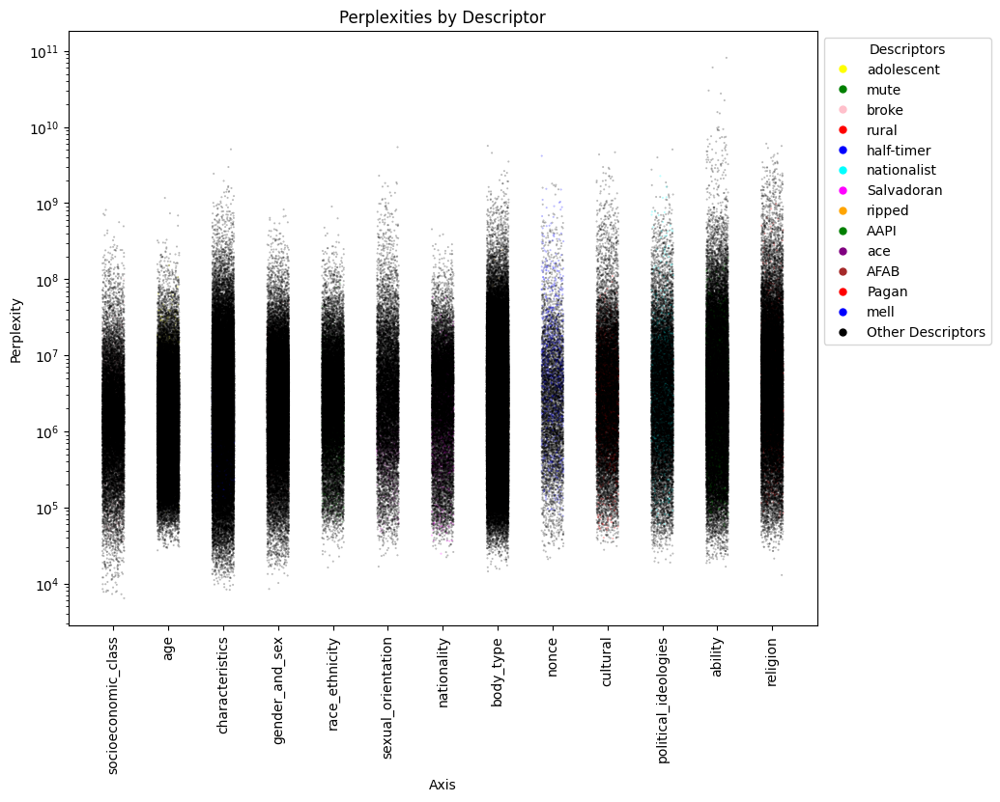

In [ ]:
main_without_personas(axes, descriptors, descriptor_colors)
# for facebook/bart-large-cnn

config.json:   0%|          | 0.00/638 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/23.9k [00:00<?, ?B/s]

model-00001-of-00008.safetensors:   0%|          | 0.00/1.89G [00:00<?, ?B/s]

model-00002-of-00008.safetensors:   0%|          | 0.00/1.95G [00:00<?, ?B/s]

model-00003-of-00008.safetensors:   0%|          | 0.00/1.98G [00:00<?, ?B/s]

model-00004-of-00008.safetensors:   0%|          | 0.00/1.95G [00:00<?, ?B/s]

model-00005-of-00008.safetensors:   0%|          | 0.00/1.98G [00:00<?, ?B/s]

model-00006-of-00008.safetensors:   0%|          | 0.00/1.95G [00:00<?, ?B/s]

model-00007-of-00008.safetensors:   0%|          | 0.00/1.98G [00:00<?, ?B/s]

model-00008-of-00008.safetensors:   0%|          | 0.00/816M [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/111 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.43k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/493k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.80M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/168 [00:00<?, ?B/s]

  0%|          | 0/2988 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/1190 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/815 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/1943 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/1433 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/1246 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/1069 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/2300 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4368 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/1196 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7418 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/3154 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/399 [00:00<?, ?it/s]

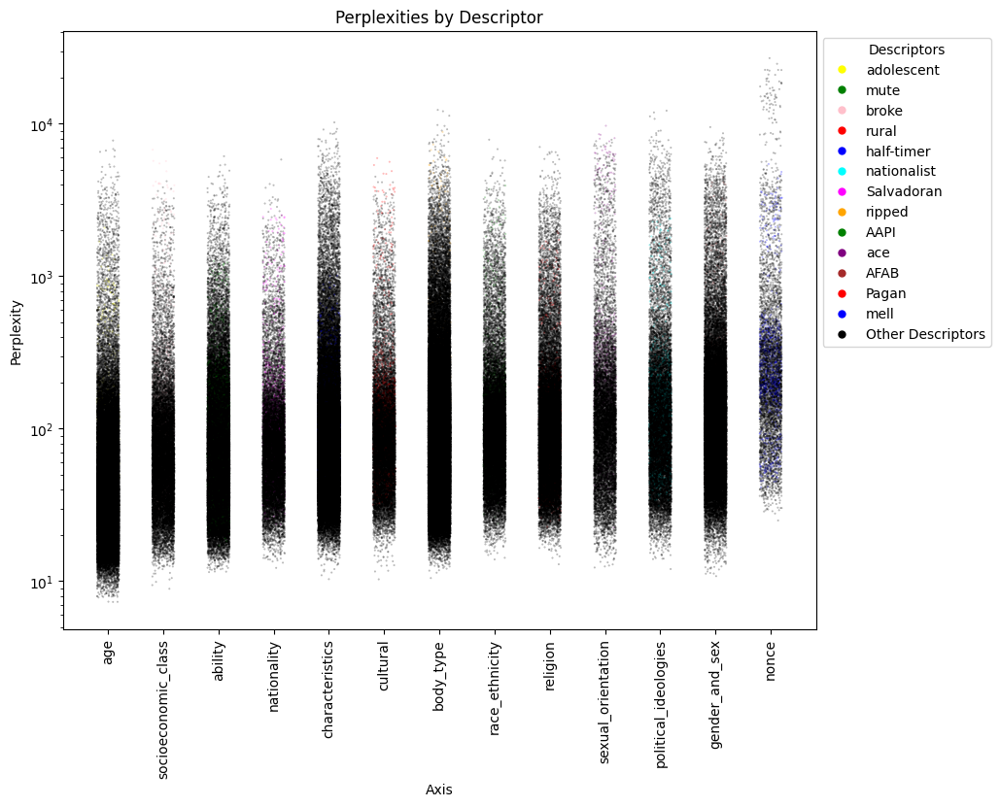

In [ ]:
main_without_personas(axes, descriptors, descriptor_colors)
# HuggingFaceH4/zephyr-7b-beta

config.json:   0%|          | 0.00/614 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/26.8k [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/9.98G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/3.50G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/188 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.62k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/500k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.84M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/414 [00:00<?, ?B/s]

  0%|          | 0/2988 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1190 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/815 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1943 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1433 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1246 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1069 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2300 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/4368 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1196 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/7418 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/3154 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/399 [00:00<?, ?it/s]

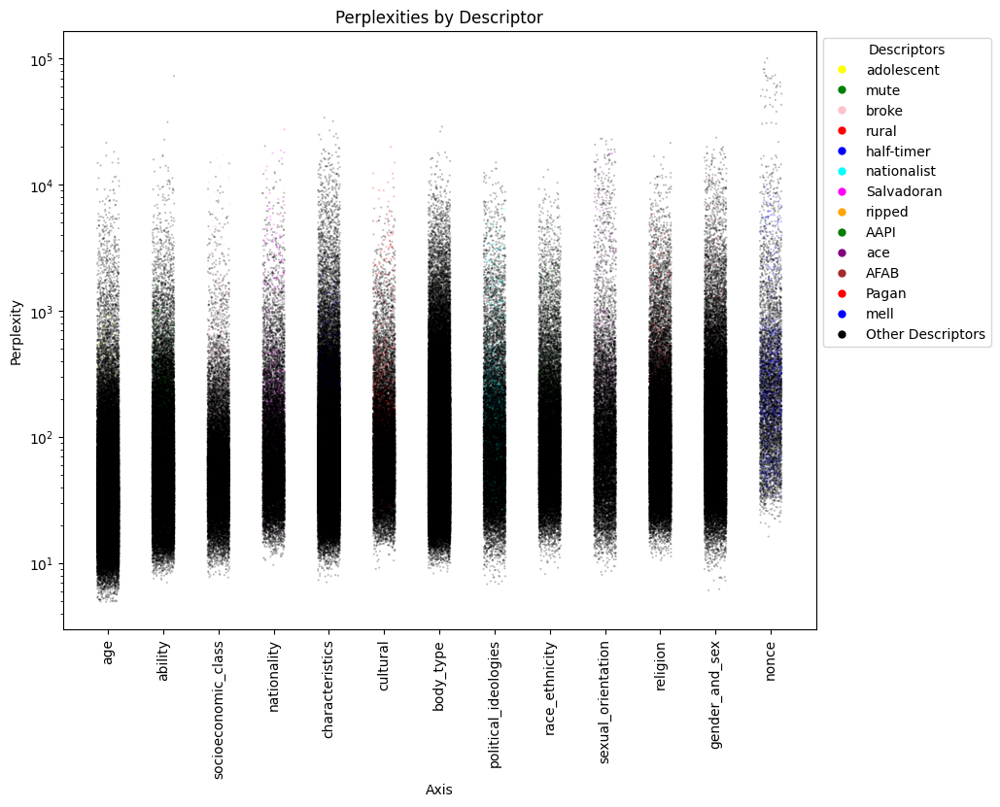

In [ ]:
main_without_personas(axes, descriptors, descriptor_colors)
# facebook/llama2

In [ ]:
def compute_perplexities(sentences_list):
    perplexity = load("perplexity", module_type="metric")
    return perplexity.compute(model_id='mistralai/Mistral-7B-v0.1', add_start_token=False, predictions=sentences_list)

config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

pytorch_model.bin.index.json:   0%|          | 0.00/23.9k [00:00<?, ?B/s]

pytorch_model-00001-of-00002.bin:   0%|          | 0.00/9.94G [00:00<?, ?B/s]

pytorch_model-00002-of-00002.bin:   0%|          | 0.00/5.06G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/967 [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/493k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.80M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/72.0 [00:00<?, ?B/s]

  0%|          | 0/2988 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1190 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/815 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1943 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1433 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1246 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1069 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2300 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/4368 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1196 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/7418 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/3154 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/399 [00:00<?, ?it/s]

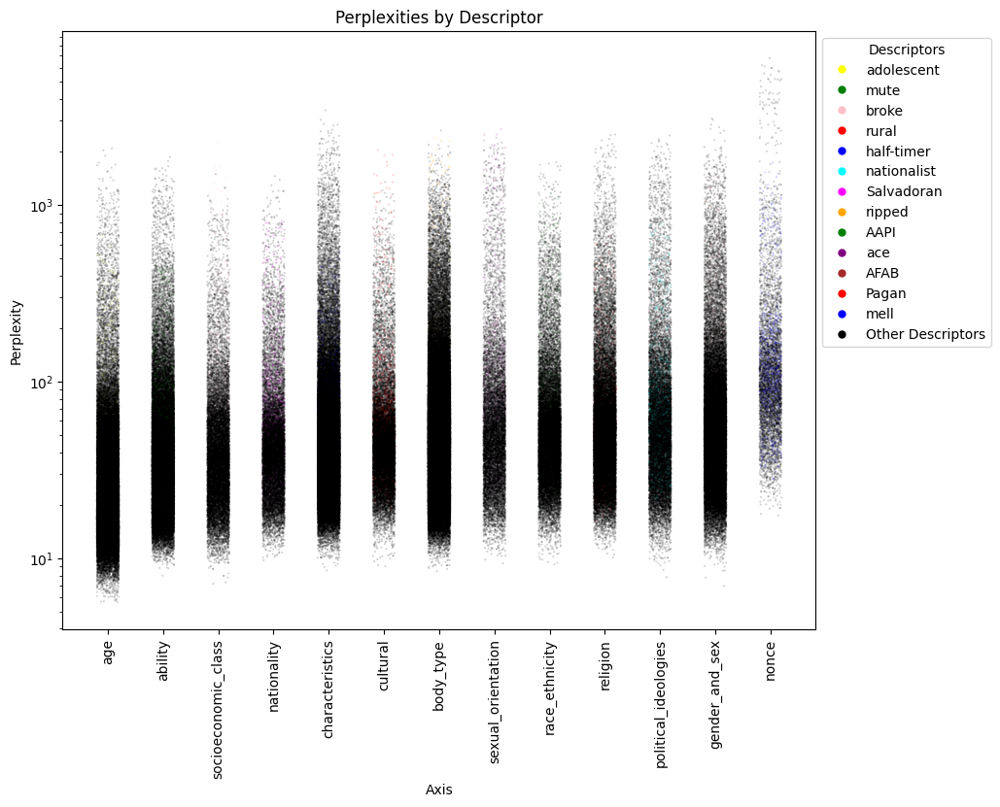

In [ ]:
main_without_personas(axes, descriptors, descriptor_colors)
# mistralai/Mistral-7B-v0.1

In [ ]:
def compute_perplexities(sentences_list):
    perplexity = load("perplexity", module_type="metric")
    return perplexity.compute(model_id='facebook/blenderbot-3B', add_start_token=False, predictions=sentences_list)

config.json:   0%|          | 0.00/1.29k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/5.47G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/347 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/74.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/150k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/62.9k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/130 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/310k [00:00<?, ?B/s]

  0%|          | 0/2988 [00:00<?, ?it/s]

  0%|          | 0/1190 [00:00<?, ?it/s]

  0%|          | 0/815 [00:00<?, ?it/s]

  0%|          | 0/1943 [00:00<?, ?it/s]

  0%|          | 0/1433 [00:00<?, ?it/s]

  0%|          | 0/1246 [00:00<?, ?it/s]

  0%|          | 0/1069 [00:00<?, ?it/s]

  0%|          | 0/2300 [00:00<?, ?it/s]

  0%|          | 0/4368 [00:00<?, ?it/s]

  0%|          | 0/1196 [00:00<?, ?it/s]

  0%|          | 0/7418 [00:00<?, ?it/s]

  0%|          | 0/3154 [00:00<?, ?it/s]

  0%|          | 0/399 [00:00<?, ?it/s]

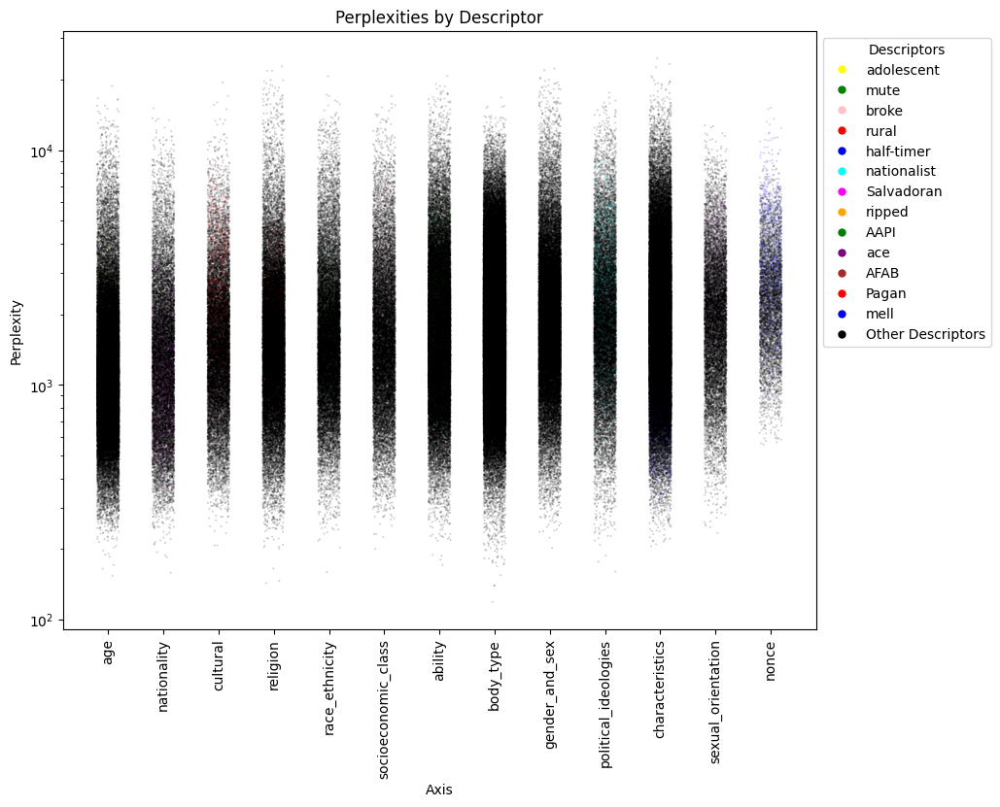

In [ ]:
main_without_personas(axes, descriptors, descriptor_colors)
# facebook/blenderbot-3B

In [ ]:
def compute_perplexities(sentences_list):
    perplexity = load("perplexity", module_type="metric")
    return perplexity.compute(model_id='google/pegasus-xsum', add_start_token=False, predictions=sentences_list)

config.json:   0%|          | 0.00/1.39k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/2.28G [00:00<?, ?B/s]

Some weights of PegasusForCausalLM were not initialized from the model checkpoint at google/pegasus-xsum and are newly initialized: ['model.decoder.embed_positions.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


generation_config.json:   0%|          | 0.00/259 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/87.0 [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/1.91M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/3.52M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/65.0 [00:00<?, ?B/s]

  0%|          | 0/2988 [00:00<?, ?it/s]

Some weights of PegasusForCausalLM were not initialized from the model checkpoint at google/pegasus-xsum and are newly initialized: ['model.decoder.embed_positions.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/1190 [00:00<?, ?it/s]

Some weights of PegasusForCausalLM were not initialized from the model checkpoint at google/pegasus-xsum and are newly initialized: ['model.decoder.embed_positions.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/815 [00:00<?, ?it/s]

Some weights of PegasusForCausalLM were not initialized from the model checkpoint at google/pegasus-xsum and are newly initialized: ['model.decoder.embed_positions.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/1943 [00:00<?, ?it/s]

Some weights of PegasusForCausalLM were not initialized from the model checkpoint at google/pegasus-xsum and are newly initialized: ['model.decoder.embed_positions.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/1433 [00:00<?, ?it/s]

Some weights of PegasusForCausalLM were not initialized from the model checkpoint at google/pegasus-xsum and are newly initialized: ['model.decoder.embed_positions.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/1246 [00:00<?, ?it/s]

Some weights of PegasusForCausalLM were not initialized from the model checkpoint at google/pegasus-xsum and are newly initialized: ['model.decoder.embed_positions.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/1069 [00:00<?, ?it/s]

Some weights of PegasusForCausalLM were not initialized from the model checkpoint at google/pegasus-xsum and are newly initialized: ['model.decoder.embed_positions.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/2300 [00:00<?, ?it/s]

Some weights of PegasusForCausalLM were not initialized from the model checkpoint at google/pegasus-xsum and are newly initialized: ['model.decoder.embed_positions.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/4368 [00:00<?, ?it/s]

Some weights of PegasusForCausalLM were not initialized from the model checkpoint at google/pegasus-xsum and are newly initialized: ['model.decoder.embed_positions.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/1196 [00:00<?, ?it/s]

Some weights of PegasusForCausalLM were not initialized from the model checkpoint at google/pegasus-xsum and are newly initialized: ['model.decoder.embed_positions.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/7418 [00:00<?, ?it/s]

Some weights of PegasusForCausalLM were not initialized from the model checkpoint at google/pegasus-xsum and are newly initialized: ['model.decoder.embed_positions.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/3154 [00:00<?, ?it/s]

Some weights of PegasusForCausalLM were not initialized from the model checkpoint at google/pegasus-xsum and are newly initialized: ['model.decoder.embed_positions.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/399 [00:00<?, ?it/s]

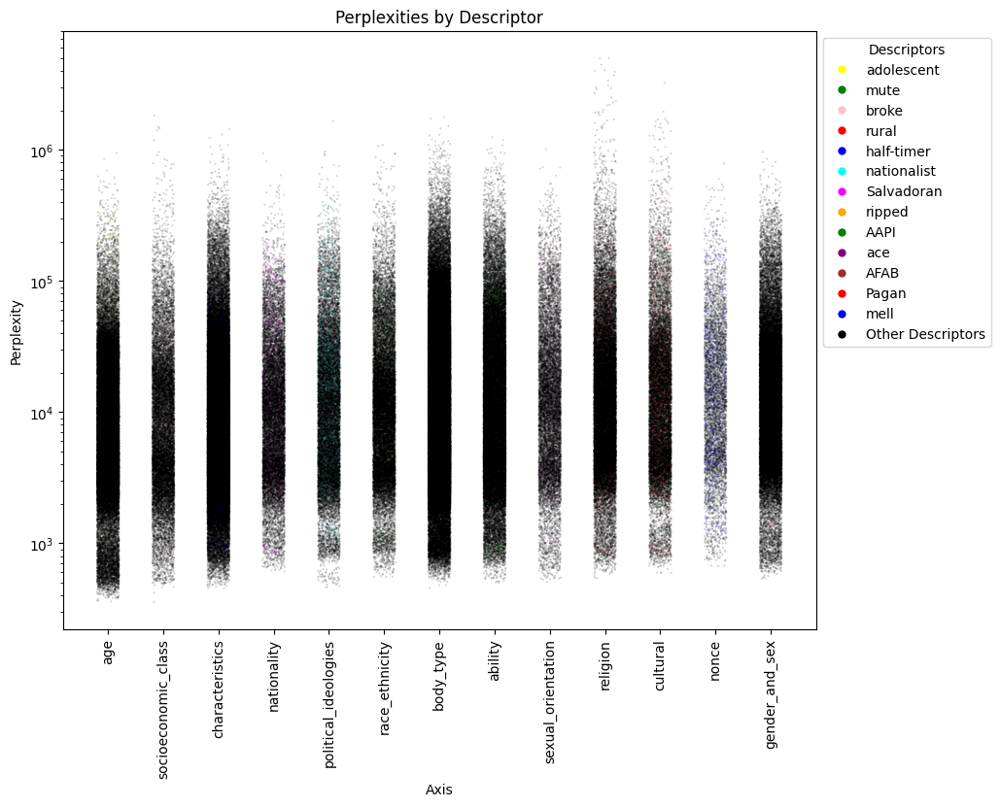

In [ ]:
main_without_personas(axes, descriptors, descriptor_colors)
# google/pegasus-xsum

**This Is the pervious approaches but contains different kinds of plots, so it might come in handy.**

> Indented block

> Indented block

Segregating it, for clarity.



In [ ]:
def main_without_personas(axes, descriptors, descriptor_colors):
    # Load data
    df = load_data('/content/drive/MyDrive/Project_Bias_Meta_paper/sentences.csv')
    # Initialize a dictionary to hold perplexity results for each axis
    perplexity_results = {}
    axis_median = {}

    # Compute perplexities and store results
    for axis in axes:
        axis_df = df[df["axis"] == axis]
        sentences_list = axis_df["text"].tolist()
        results = compute_perplexities(sentences_list)
        axis_df = axis_df.assign(perplexity=results["perplexities"])
        perplexity_results[axis] = axis_df
        axis_median[axis] = axis_df['perplexity'].median()

    # Sort axes based on the median perplexity
    sorted_axes = sorted(axes, key=lambda x: axis_median[x])

    # Plotting
    plt.figure(figsize=(10, 8))

    # Precompute axis indices to avoid recomputation inside loop
    axis_indices = {axis: idx for idx, axis in enumerate(sorted_axes)}

    # Use vectorized operations for plotting
    for axis in sorted_axes:
        axis_specific_df = perplexity_results[axis]

        # Determine colors for each descriptor
        colors = axis_specific_df['descriptor'].apply(lambda x: descriptor_colors.get(x, 'black') if x in descriptors else 'black').values
        x_indices = np.array([axis_indices[axis]] * len(axis_specific_df))
        x_jitters = np.random.uniform(-0.2, 0.2, size=len(axis_specific_df))

        # Plot all points for the axis
        plt.scatter(x_indices + x_jitters, axis_specific_df['perplexity'], c=colors, s=0.2, alpha=0.3)

    plt.yscale('log')  # Apply logarithmic scale to y-axis
    plt.title('Perplexities by Descriptor')
    plt.xlabel('Axis')
    plt.ylabel('Perplexity')
    plt.xticks(ticks=list(axis_indices.values()), labels=sorted_axes, rotation=90)

    # Create a custom legend for descriptors
    handles = [plt.Line2D([0], [0], marker='o', color=color, linestyle='', markersize=5, label=descriptor)
               for descriptor, color in descriptor_colors.items() if descriptor in descriptors] + \
              [plt.Line2D([0], [0], marker='o', color='black', linestyle='', markersize=5, label='Other Descriptors')]
    plt.legend(handles=handles, title='Descriptors', loc='upper left', bbox_to_anchor=(1, 1))

    plt.show()

In [3]:
# Using scaled graphs for better comparison, all this graphs will do is changing the limits of the y axis using the "plt.ylim(argument)"

def main_persona_Scaled(axes, descriptors, descriptor_colors, persona_text):
    df = load_data('/content/drive/MyDrive/Project_Bias_Meta_paper/sentences.csv')

    # Add persona to the given text, this might increase the bias given the influence of the length of persona
    df['text_with_persona'] = persona_text + " " + df['text']

    # dictionaries
    perplexity_results = {}
    axis_median = {}

    # Compute perplexities for each axis, same logic
    for axis in axes:
        axis_df = df[df['axis'] == axis]
        sentences_list = axis_df['text_with_persona'].tolist()
        results = compute_perplexities(sentences_list)
        axis_df = axis_df.assign(perplexity=results["perplexities"])
        perplexity_results[axis] = axis_df
        axis_median[axis] = axis_df['perplexity'].median()

    # median perplexity, same logic
    sorted_axes = sorted(axes, key=lambda x: axis_median[x])

    # Plotting , same logic
    plt.figure(figsize=(16, 10))
    axis_indices = {axis: idx for idx, axis in enumerate(sorted_axes)}

    for axis in sorted_axes:
        axis_specific_df = perplexity_results[axis]
        # Vectorize color assignment : The to_numpy() function is used to convert the resulting Series of colors into a NumPy array, making it suitable for efficient use in plotting.
        colors = axis_specific_df['descriptor'].apply(lambda d: descriptor_colors.get(d, 'black')).to_numpy()
        # x_values of the same length as axis_specific_df. Each element in this array is set to the index value of the current 'axis' in the axis_indices dictionary.
        # This ensures that all data points for the current 'axis' are plotted at the same x-coordinate.
        x_values = np.full(len(axis_specific_df), axis_indices[axis])
        # generate random jitter values using np.random.uniform to add a small horizontal offset to the data points
        x_jitters = np.random.uniform(-0.2, 0.2, size=len(axis_specific_df))
        plt.scatter(x_values + x_jitters, axis_specific_df['perplexity'], c=colors, s=0.2, alpha=0.2)

    # for making comparisonpision easy, change the y lim to your choice.
    plt.ylim(0, 17500)
    # logging to convert it to a gaussian data. Usign symlog here.
    plt.yscale('symlog')
    plt.title('Perplexities by Descriptor with Persona')
    plt.xlabel('Axis')
    plt.ylabel('Perplexity')
    plt.xticks(ticks=list(axis_indices.values()), labels=sorted_axes, rotation=90)

    #legend
    handles = [plt.Line2D([0], [0], marker='o', color=color, linestyle='', markersize=10, label=descriptor)
               for descriptor, color in descriptor_colors.items()] + \
              [plt.Line2D([0], [0], marker='o', color='black', linestyle='', markersize=10, label='Other Descriptors')]
    plt.legend(handles=handles, title='Descriptor', loc='upper left', bbox_to_anchor=(1, 1))

    plt.show()

In [ ]:
axes = ["age", "socioeconomic_class", "sexual_orientation", "religion", "race_ethnicity", "political_ideologies", "nationality", "gender_and_sex", "characteristics", "cultural", "body_type", "ability","nonce"]
descriptors = ["adolescent", "mute", "broke", "half-timer", "rural", "nationalist", "Salvadoran", "ripped", "AAPI", "ace", "AFAB", "Pagan","mell"]
descriptor_colors = {
    'adolescent': 'yellow',
    'mute': 'green',
    'broke': 'pink',
    'rural': 'red',
    'half-timer' : 'blue',
    'nationalist': 'cyan',
    'Salvadoran': 'magenta',
    'ripped': 'orange',
    'AAPI': 'green',
    'ace': 'purple',
    'AFAB': 'brown',
    "Pagan": "red",
    "mell": "blue"
}

persona_text = ("Add Text here \n")
# persona_text = (
#     "Name: John\n"
#     "Age: 45\n"
#     "Occupation: High school history teacher\n"
#     "Interests: Reading historical novels, gardening, and bird watching\n"
#     "Personality: Patient, curious, slightly reserved.\n"
# )

  0%|          | 0/2988 [00:00<?, ?it/s]

  0%|          | 0/1190 [00:00<?, ?it/s]

  0%|          | 0/815 [00:00<?, ?it/s]

  0%|          | 0/1943 [00:00<?, ?it/s]

  0%|          | 0/1433 [00:00<?, ?it/s]

  0%|          | 0/1246 [00:00<?, ?it/s]

  0%|          | 0/1069 [00:00<?, ?it/s]

  0%|          | 0/2300 [00:00<?, ?it/s]

  0%|          | 0/4368 [00:00<?, ?it/s]

  0%|          | 0/1196 [00:00<?, ?it/s]

  0%|          | 0/7418 [00:00<?, ?it/s]

  0%|          | 0/3154 [00:00<?, ?it/s]

  0%|          | 0/399 [00:00<?, ?it/s]

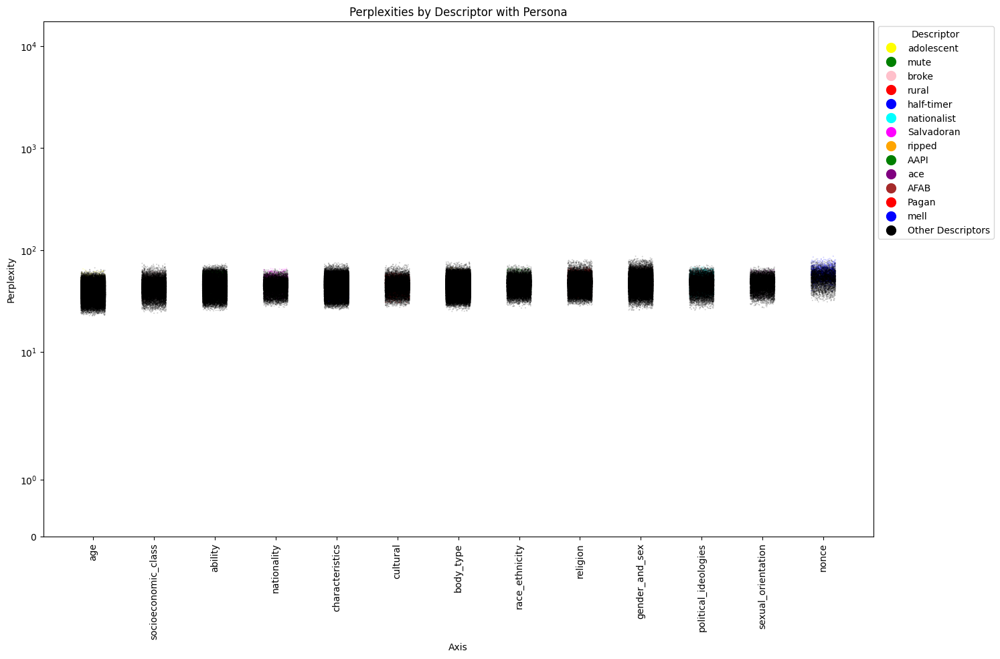

In [ ]:
main_persona_Scaled(axes, descriptors, descriptor_colors, persona_text)

In [ ]:
# Code for plotting with personas
def main_persona1(axes, descriptors, descriptor_colors, persona_text):
    df = load_data('/content/drive/MyDrive/Project_Bias_Meta_paper/sentences.csv')

    # Add persona
    df['text_with_persona'] = persona_text + " " + df['text']

    # dictionaries
    perplexity_results = {}
    axis_median = {}

    # Compute perplexities for each axis
    for axis in axes:
        axis_df = df[df['axis'] == axis]
        sentences_list = axis_df['text_with_persona'].tolist()
        results = compute_perplexities(sentences_list)  # Make sure to define or import this function
        axis_df = axis_df.assign(perplexity=results["perplexities"])
        perplexity_results[axis] = axis_df
        axis_median[axis] = axis_df['perplexity'].median()

    # median perplexity
    sorted_axes = sorted(axes, key=lambda x: axis_median[x])

    # Plotting
    plt.figure(figsize=(16, 10))
    axis_indices = {axis: idx for idx, axis in enumerate(sorted_axes)}

    for axis in sorted_axes:
        axis_specific_df = perplexity_results[axis]
        # Vectorize color assignment
        colors = axis_specific_df['descriptor'].apply(lambda d: descriptor_colors.get(d, 'black')).to_numpy()
        x_values = np.full(len(axis_specific_df), axis_indices[axis])
        x_jitters = np.random.uniform(-0.2, 0.2, size=len(axis_specific_df))
        plt.scatter(x_values + x_jitters, axis_specific_df['perplexity'], c=colors, s=0.2, alpha=0.2)


    plt.yscale('log')
    plt.title('Perplexities by Descriptor with Persona')
    plt.xlabel('Axis')
    plt.ylabel('Perplexity')
    plt.xticks(ticks=list(axis_indices.values()), labels=sorted_axes, rotation=90)

    #legend
    handles = [plt.Line2D([0], [0], marker='o', color=color, linestyle='', markersize=10, label=descriptor)
               for descriptor, color in descriptor_colors.items()] + \
              [plt.Line2D([0], [0], marker='o', color='black', linestyle='', markersize=10, label='Other Descriptors')]
    plt.legend(handles=handles, title='Descriptor', loc='upper left', bbox_to_anchor=(1, 1))

    plt.show()

In [ ]:
axes = ["age", "socioeconomic_class", "sexual_orientation", "religion", "race_ethnicity", "political_ideologies", "nationality", "gender_and_sex", "characteristics", "cultural", "body_type", "ability","nonce"]
descriptors = ["adolescent", "mute", "broke", "half-timer", "rural", "nationalist", "Salvadoran", "ripped", "AAPI", "ace", "AFAB", "Pagan","mell"]
descriptor_colors = {
    'adolescent': 'yellow',
    'mute': 'green',
    'broke': 'pink',
    'rural': 'red',
    'half-timer' : 'blue',
    'nationalist': 'cyan',
    'Salvadoran': 'magenta',
    'ripped': 'orange',
    'AAPI': 'green',
    'ace': 'purple',
    'AFAB': 'brown',
    "Pagan": "red",
    "mell": "blue"
}

persona_text = ("Add Text here \n")
# persona_text = (
#     "Name: John\n"
#     "Age: 45\n"
#     "Occupation: High school history teacher\n"
#     "Interests: Reading historical novels, gardening, and bird watching\n"
#     "Personality: Patient, curious, slightly reserved.\n"
# )

  0%|          | 0/2988 [00:00<?, ?it/s]

  0%|          | 0/1190 [00:00<?, ?it/s]

  0%|          | 0/815 [00:00<?, ?it/s]

  0%|          | 0/1943 [00:00<?, ?it/s]

  0%|          | 0/1433 [00:00<?, ?it/s]

  0%|          | 0/1246 [00:00<?, ?it/s]

  0%|          | 0/1069 [00:00<?, ?it/s]

  0%|          | 0/2300 [00:00<?, ?it/s]

  0%|          | 0/4368 [00:00<?, ?it/s]

  0%|          | 0/1196 [00:00<?, ?it/s]

  0%|          | 0/7418 [00:00<?, ?it/s]

  0%|          | 0/3154 [00:00<?, ?it/s]

  0%|          | 0/399 [00:00<?, ?it/s]

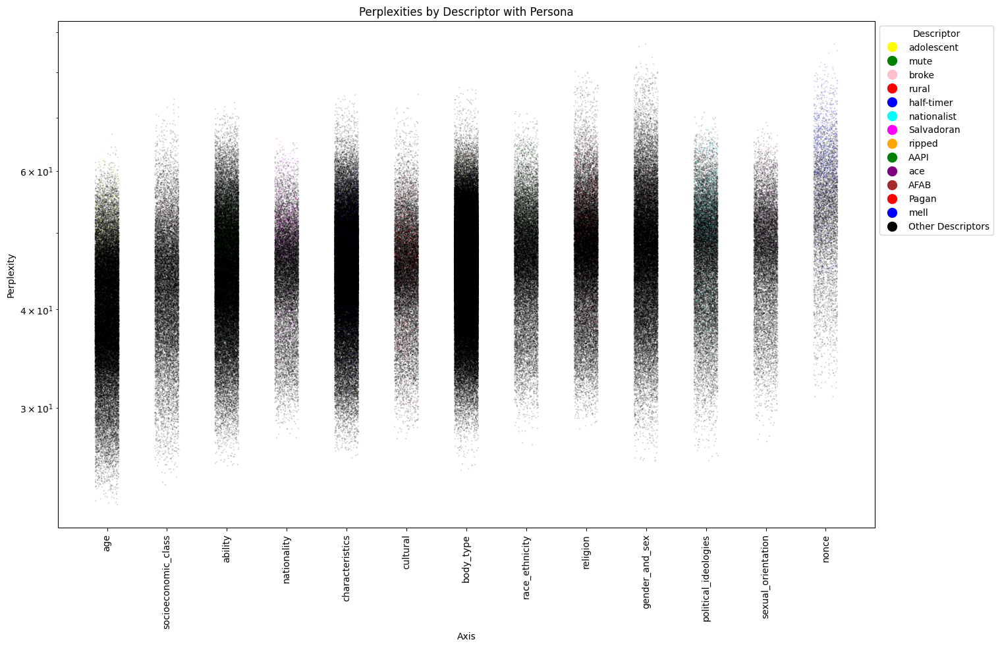

In [ ]:
main_persona1(axes, descriptors, descriptor_colors, persona_text)

In [ ]:
main_persona1(axes, descriptors, descriptor_colors, persona_text)

In [ ]:
persona_text = (
    "Persona: Casual Chris\n"
    "Age: 34\n"
    "Occupation: Software developer\n"
    "Interests: Video games, stand-up comedy, craft beer\n"
    "Personality: Relaxed, humorous, tech-savvy\n"
    "Typical Questions: Casual explanations of tech concepts, jokes, recommendations for weekend activities.\n"
)

config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

  0%|          | 0/2988 [00:00<?, ?it/s]

  0%|          | 0/1190 [00:00<?, ?it/s]

  0%|          | 0/815 [00:00<?, ?it/s]

  0%|          | 0/1943 [00:00<?, ?it/s]

  0%|          | 0/1433 [00:00<?, ?it/s]

  0%|          | 0/1246 [00:00<?, ?it/s]

  0%|          | 0/1069 [00:00<?, ?it/s]

  0%|          | 0/2300 [00:00<?, ?it/s]

  0%|          | 0/4368 [00:00<?, ?it/s]

  0%|          | 0/1196 [00:00<?, ?it/s]

  0%|          | 0/7418 [00:00<?, ?it/s]

  0%|          | 0/3154 [00:00<?, ?it/s]

  0%|          | 0/399 [00:00<?, ?it/s]

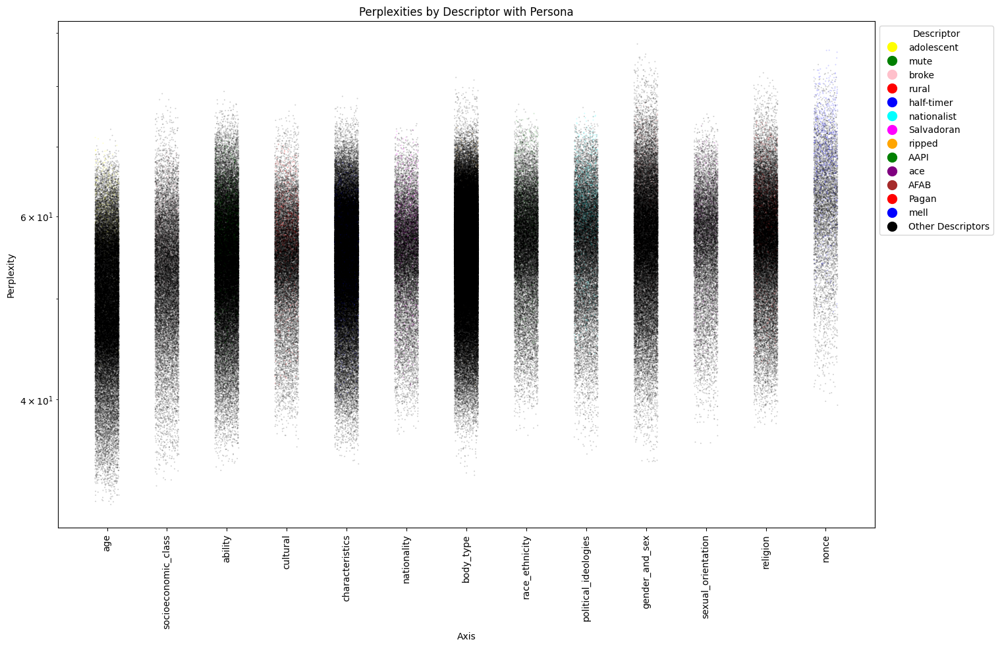

In [ ]:
main_persona1(axes, descriptors, descriptor_colors, persona_text)

In [ ]:
main_persona1(axes, descriptors, descriptor_colors, persona_text)

In [ ]:
persona_text = (
    "Age: 22\n"
    "Occupation: Author and screenwriter\n"
    "Interests: Classic literature, cinema, theater\n"
    "Personality: Imaginative, expressive, emotional\n"
    "Typical Questions: Creative prompts, storyline development, character dialogue suggestions."
)

  0%|          | 0/2988 [00:00<?, ?it/s]

  0%|          | 0/1190 [00:00<?, ?it/s]

  0%|          | 0/815 [00:00<?, ?it/s]

  0%|          | 0/1943 [00:00<?, ?it/s]

  0%|          | 0/1433 [00:00<?, ?it/s]

  0%|          | 0/1246 [00:00<?, ?it/s]

  0%|          | 0/1069 [00:00<?, ?it/s]

  0%|          | 0/2300 [00:00<?, ?it/s]

  0%|          | 0/4368 [00:00<?, ?it/s]

  0%|          | 0/1196 [00:00<?, ?it/s]

  0%|          | 0/7418 [00:00<?, ?it/s]

  0%|          | 0/3154 [00:00<?, ?it/s]

  0%|          | 0/399 [00:00<?, ?it/s]

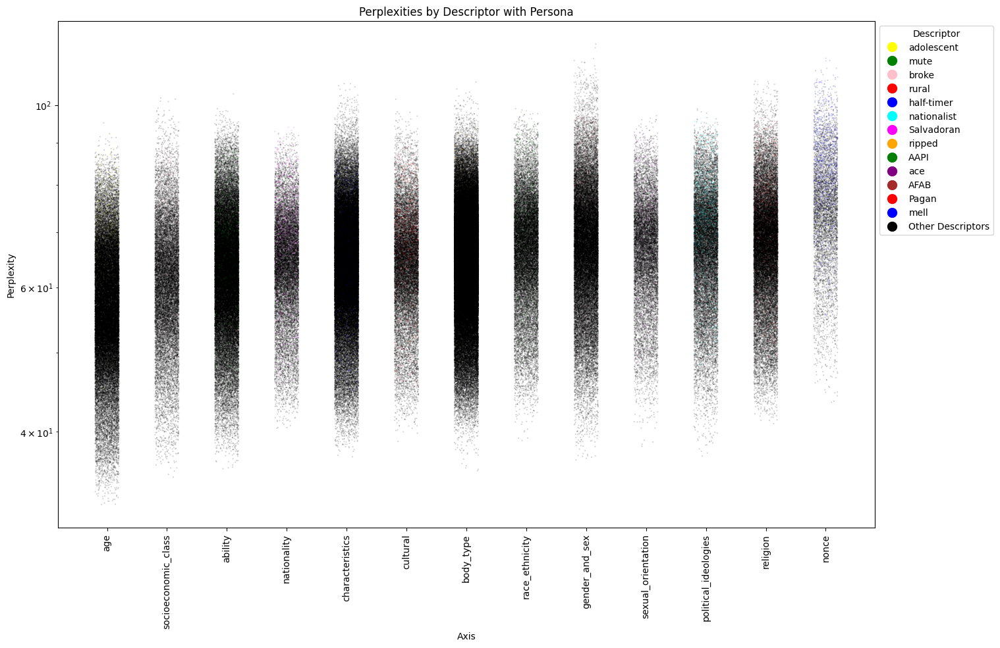

In [ ]:
main_persona1(axes, descriptors, descriptor_colors, persona_text)

In [ ]:
main_persona(axes, descriptors, descriptor_colors, persona_text)

In [ ]:
persona_text = (
    "Age: 50\n"
    "Occupation: Life coach\n"
    "Interests: Self-help books, meditation, public speaking\n"
    "Personality: Uplifting, passionate, goal-driven\n"
    "Typical Questions: Inspiring quotes, tips for personal development, strategies for overcoming challenges.\n"
)

  0%|          | 0/2988 [00:00<?, ?it/s]

  0%|          | 0/1190 [00:00<?, ?it/s]

  0%|          | 0/815 [00:00<?, ?it/s]

  0%|          | 0/1943 [00:00<?, ?it/s]

  0%|          | 0/1433 [00:00<?, ?it/s]

  0%|          | 0/1246 [00:00<?, ?it/s]

  0%|          | 0/1069 [00:00<?, ?it/s]

  0%|          | 0/2300 [00:00<?, ?it/s]

  0%|          | 0/4368 [00:00<?, ?it/s]

  0%|          | 0/1196 [00:00<?, ?it/s]

  0%|          | 0/7418 [00:00<?, ?it/s]

  0%|          | 0/3154 [00:00<?, ?it/s]

  0%|          | 0/399 [00:00<?, ?it/s]

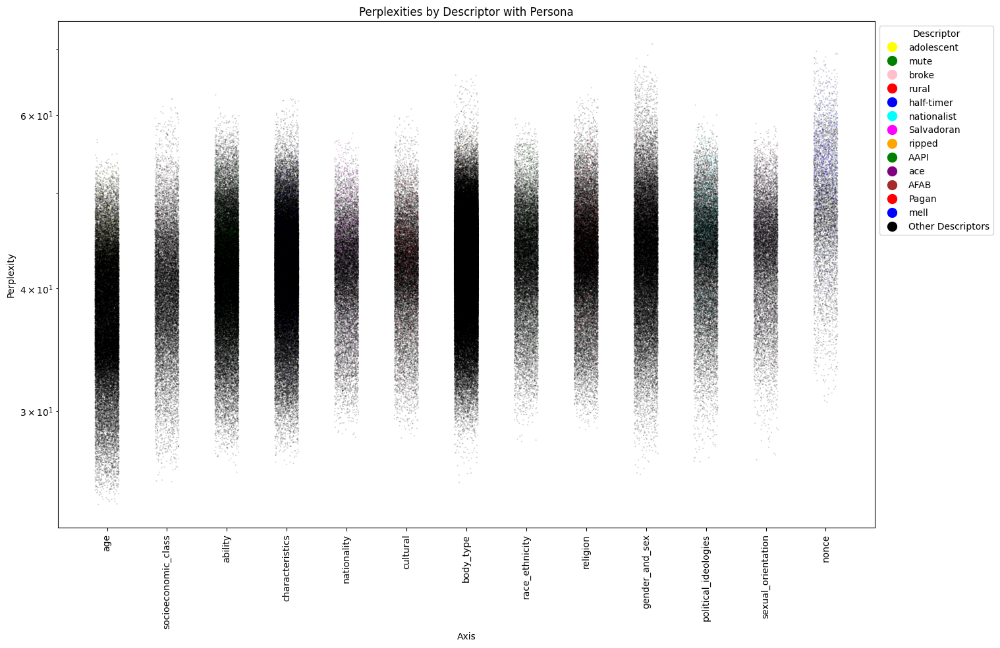

In [ ]:
main_persona1(axes, descriptors, descriptor_colors, persona_text)

In [ ]:
main_persona(axes, descriptors, descriptor_colors, persona_text)

In [ ]:
persona_text = (
    "Name: John\n"
    "Age: 45\n"
    "Occupation: High school history teacher\n"
    "Interests: Reading historical novels, gardening, and bird watching\n"
    "Personality: Patient, curious, slightly reserved.\n"
)

  0%|          | 0/2988 [00:00<?, ?it/s]

  0%|          | 0/1190 [00:00<?, ?it/s]

  0%|          | 0/815 [00:00<?, ?it/s]

  0%|          | 0/1943 [00:00<?, ?it/s]

  0%|          | 0/1433 [00:00<?, ?it/s]

  0%|          | 0/1246 [00:00<?, ?it/s]

  0%|          | 0/1069 [00:00<?, ?it/s]

  0%|          | 0/2300 [00:00<?, ?it/s]

  0%|          | 0/4368 [00:00<?, ?it/s]

  0%|          | 0/1196 [00:00<?, ?it/s]

  0%|          | 0/7418 [00:00<?, ?it/s]

  0%|          | 0/3154 [00:00<?, ?it/s]

  0%|          | 0/399 [00:00<?, ?it/s]

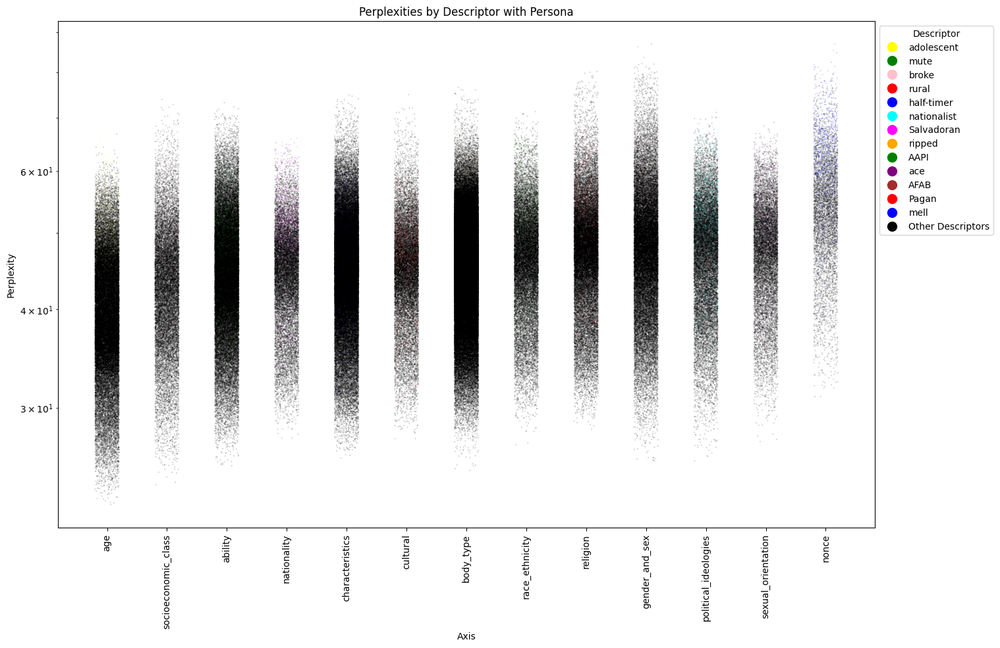

In [ ]:
main_persona1(axes, descriptors, descriptor_colors, persona_text)

In [ ]:
#  Graph - Code to compare ppl for sentences with and without personas.

def compare_perplexities(axes, descriptors, descriptor_colors, persona_text):
    # Load data
    df = load_data('/content/drive/MyDrive/Project_Bias_Meta_paper/sentences.csv')

    # Initialize a dictionary to hold perplexity results
    perplexity_results_without_persona = {}
    perplexity_results_with_persona = {}

    # Compute perplexities without personas
    for axis in axes:
        axis_df = df[df["axis"] == axis]
        sentences_list = axis_df["text"].tolist()
        results = compute_perplexities(sentences_list)
        axis_df = axis_df.assign(perplexity=results["perplexities"])
        perplexity_results_without_persona[axis] = axis_df

    # Compute perplexities with personas
    df['text_with_persona'] = persona_text + " " + df['text']
    for axis in axes:
        axis_df = df[df['axis'] == axis]
        sentences_list = axis_df['text_with_persona'].tolist()
        results = compute_perplexities(sentences_list)
        axis_df = axis_df.assign(perplexity=results["perplexities"])
        perplexity_results_with_persona[axis] = axis_df

    # Plotting side by side
    num_axes = len(axes)
    plt.figure(figsize=(num_axes * 4, 8))  # Adjust the size as needed

    for idx, axis in enumerate(axes, 1):
        # Without personas
        plt.subplot(2, num_axes, idx)
        axis_specific_df = perplexity_results_without_persona[axis]
        colors = axis_specific_df['descriptor'].apply(lambda x: descriptor_colors.get(x, 'black')).values
        x_values = np.random.uniform(idx - 0.2, idx + 0.2, size=len(axis_specific_df))
        plt.scatter(x_values, axis_specific_df['perplexity'], c=colors, s=0.2, alpha=0.3)
        plt.title(f'Without Persona - {axis}')
        plt.yscale('log')
        plt.ylim(1, 17500)  # assuming a minimum perplexity of 1 to avoid log(0)
        if idx == 1:
            plt.ylabel('Perplexity')

        # With personas
        plt.subplot(2, num_axes, idx + num_axes)
        axis_specific_df = perplexity_results_with_persona[axis]
        colors = axis_specific_df['descriptor'].apply(lambda x: descriptor_colors.get(x, 'black')).values
        x_values = np.random.uniform(idx - 0.2, idx + 0.2, size=len(axis_specific_df))
        plt.scatter(x_values, axis_specific_df['perplexity'], c=colors, s=0.2, alpha=0.3)
        plt.title(f'With Persona - {axis}')
        plt.yscale('log')
        plt.ylim(1, 17500)  # assuming a minimum perplexity of 1 to avoid log(0)
        if idx == 1:
            plt.ylabel('Perplexity')
        plt.xticks([])  # Hide x-axis ticks

    # Adjust layout
    plt.tight_layout()
    plt.show()


In [ ]:
axes = ["age", "socioeconomic_class", "sexual_orientation", "religion", "race_ethnicity", "political_ideologies", "nationality", "gender_and_sex", "characteristics", "cultural", "body_type", "ability","nonce"]
descriptors = ["adolescent", "mute", "broke", "half-timer", "rural", "nationalist", "Salvadoran", "ripped", "AAPI", "ace", "AFAB", "Pagan","mell"]
descriptor_colors = {
    'adolescent': 'yellow',
    'mute': 'green',
    'broke': 'pink',
    'rural': 'red',
    'half-timer' : 'blue',
    'nationalist': 'cyan',
    'Salvadoran': 'magenta',
    'ripped': 'orange',
    'AAPI': 'green',
    'ace': 'purple',
    'AFAB': 'brown',
    "Pagan": "red",
    "mell": "blue"
}

persona_text = ("Add Text here")

  0%|          | 0/2988 [00:00<?, ?it/s]

  0%|          | 0/1190 [00:00<?, ?it/s]

  0%|          | 0/815 [00:00<?, ?it/s]

  0%|          | 0/1943 [00:00<?, ?it/s]

  0%|          | 0/1433 [00:00<?, ?it/s]

  0%|          | 0/1246 [00:00<?, ?it/s]

  0%|          | 0/1069 [00:00<?, ?it/s]

  0%|          | 0/2300 [00:00<?, ?it/s]

  0%|          | 0/4368 [00:00<?, ?it/s]

  0%|          | 0/1196 [00:00<?, ?it/s]

  0%|          | 0/7418 [00:00<?, ?it/s]

  0%|          | 0/3154 [00:00<?, ?it/s]

  0%|          | 0/399 [00:00<?, ?it/s]

  0%|          | 0/2988 [00:00<?, ?it/s]

  0%|          | 0/1190 [00:00<?, ?it/s]

  0%|          | 0/815 [00:00<?, ?it/s]

  0%|          | 0/1943 [00:00<?, ?it/s]

  0%|          | 0/1433 [00:00<?, ?it/s]

  0%|          | 0/1246 [00:00<?, ?it/s]

  0%|          | 0/1069 [00:00<?, ?it/s]

  0%|          | 0/2300 [00:00<?, ?it/s]

  0%|          | 0/4368 [00:00<?, ?it/s]

  0%|          | 0/1196 [00:00<?, ?it/s]

  0%|          | 0/7418 [00:00<?, ?it/s]

  0%|          | 0/3154 [00:00<?, ?it/s]

  0%|          | 0/399 [00:00<?, ?it/s]

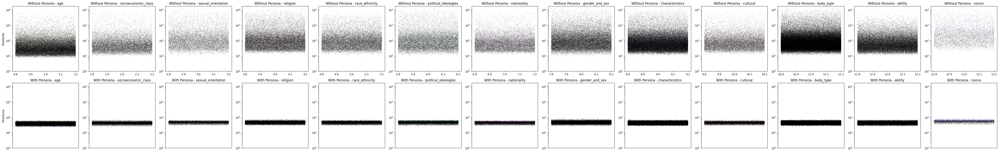

In [ ]:
compare_perplexities(axes, descriptors, descriptor_colors, persona_text)

In [ ]:
# Comparing Heatmaps of the sentences with and without personas.

def compare_perplexities_side_by_side(axes, descriptors, descriptor_colors, persona_text):
    # Load data
    df = load_data('/content/drive/MyDrive/Project_Bias_Meta_paper/sentences.csv')

    # Compute perplexities without personas
    perplexity_results_without_persona = {axis: compute_perplexities(df[df["axis"] == axis]["text"].tolist())
                                          for axis in axes}

    # Compute perplexities with personas
    df['text_with_persona'] = persona_text + " " + df['text']
    perplexity_results_with_persona = {axis: compute_perplexities(df[df["axis"] == axis]["text_with_persona"].tolist())
                                       for axis in axes}

    # Determine the median perplexities
    axis_median_without_persona = {axis: np.median(perplexity_results_without_persona[axis]["perplexities"])
                                   for axis in axes}
    axis_median_with_persona = {axis: np.median(perplexity_results_with_persona[axis]["perplexities"])
                                for axis in axes}

    # Sort axes based on median perplexity without personas
    sorted_axes = sorted(axes, key=lambda x: axis_median_without_persona[x])

    # Create subplots
    fig, axs = plt.subplots(1, len(axes) * 2, figsize=(len(axes) * 4, 6), sharey=True)

    for i, axis in enumerate(sorted_axes):
        # Plot without personas
        axis_data_without_persona = df[df["axis"] == axis]["text"].tolist()
        perplexities_without_persona = perplexity_results_without_persona[axis]["perplexities"]
        axs[i * 2].scatter(np.random.normal(i, 0.1, size=len(perplexities_without_persona)), perplexities_without_persona, alpha=0.5)
        axs[i * 2].set_title(f'{axis} (No Persona)')
        axs[i * 2].set_yscale('log')
        axs[i * 2].set_ylim(1, 17500)

        # Plot with personas
        axis_data_with_persona = df[df["axis"] == axis]["text_with_persona"].tolist()
        perplexities_with_persona = perplexity_results_with_persona[axis]["perplexities"]
        axs[i * 2 + 1].scatter(np.random.normal(i, 0.1, size=len(perplexities_with_persona)), perplexities_with_persona, alpha=0.5, color='orange')
        axs[i * 2 + 1].set_title(f'{axis} (With Persona)')

    # Set a common Y-axis label
    fig.text(0.04, 0.5, 'Perplexity', va='center', rotation='vertical')

    plt.tight_layout()
    plt.show()


In [ ]:
axes = ["age", "socioeconomic_class", "sexual_orientation", "religion", "race_ethnicity", "political_ideologies", "nationality", "gender_and_sex", "characteristics", "cultural", "body_type", "ability","nonce"]
descriptors = ["adolescent", "mute", "broke", "half-timer", "rural", "nationalist", "Salvadoran", "ripped", "AAPI", "ace", "AFAB", "Pagan","mell"]
descriptor_colors = {
    'adolescent': 'yellow',
    'mute': 'green',
    'broke': 'pink',
    'rural': 'red',
    'half-timer' : 'blue',
    'nationalist': 'cyan',
    'Salvadoran': 'magenta',
    'ripped': 'orange',
    'AAPI': 'green',
    'ace': 'purple',
    'AFAB': 'brown',
    "Pagan": "red",
    "mell": "blue"
}

persona_text = ("Add Text here \n")

  0%|          | 0/2988 [00:00<?, ?it/s]

  0%|          | 0/1190 [00:00<?, ?it/s]

  0%|          | 0/815 [00:00<?, ?it/s]

  0%|          | 0/1943 [00:00<?, ?it/s]

  0%|          | 0/1433 [00:00<?, ?it/s]

  0%|          | 0/1246 [00:00<?, ?it/s]

  0%|          | 0/1069 [00:00<?, ?it/s]

  0%|          | 0/2300 [00:00<?, ?it/s]

  0%|          | 0/4368 [00:00<?, ?it/s]

  0%|          | 0/1196 [00:00<?, ?it/s]

  0%|          | 0/7418 [00:00<?, ?it/s]

  0%|          | 0/3154 [00:00<?, ?it/s]

  0%|          | 0/399 [00:00<?, ?it/s]

  0%|          | 0/2988 [00:00<?, ?it/s]

  0%|          | 0/1190 [00:00<?, ?it/s]

  0%|          | 0/815 [00:00<?, ?it/s]

  0%|          | 0/1943 [00:00<?, ?it/s]

  0%|          | 0/1433 [00:00<?, ?it/s]

  0%|          | 0/1246 [00:00<?, ?it/s]

  0%|          | 0/1069 [00:00<?, ?it/s]

  0%|          | 0/2300 [00:00<?, ?it/s]

  0%|          | 0/4368 [00:00<?, ?it/s]

  0%|          | 0/1196 [00:00<?, ?it/s]

  0%|          | 0/7418 [00:00<?, ?it/s]

  0%|          | 0/3154 [00:00<?, ?it/s]

  0%|          | 0/399 [00:00<?, ?it/s]

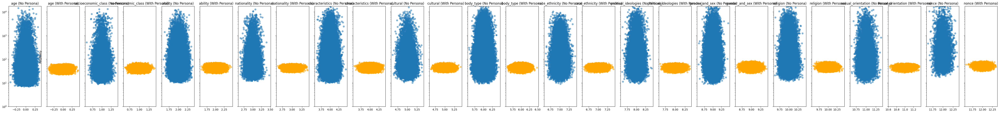

In [ ]:
compare_perplexities_side_by_side(axes, descriptors, descriptor_colors, persona_text)

In [ ]:
# Thankyou ;